# Dimensionality Reduction

---

**Topics covered:**
1. Linear methods: PCA, Factor Analysis, ICA, MCA
2. Kernel PCA
3. Non-linear methods: t-SNE, UMAP
4. Anomaly Detection

In [45]:
# Setup
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, FactorAnalysis, FastICA, KernelPCA
from sklearn.manifold import TSNE
from sklearn.datasets import make_circles, load_digits
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.covariance import EllipticEnvelope
import umap
import prince
import random

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model

plt.style.use('seaborn-v0_8-whitegrid')
np.random.seed(42)
tf.random.set_seed(42)

print("✅ Ready!")

✅ Ready!


# Part 2: Linear vs. Non-Linear Dimensionality Reduction




Linear methods reduce dimensions by projecting data onto a flat plane, whereas non-linear methods identify and unfold the data's underlying curved structure to preserve the true relationships between points.

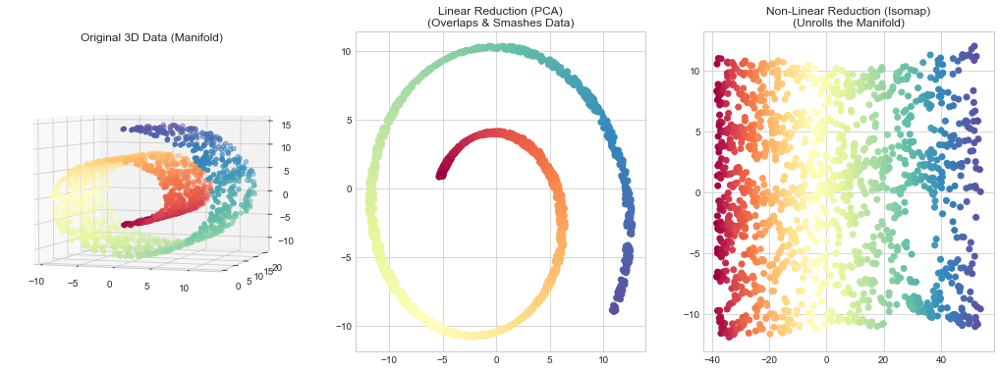

In [67]:
import matplotlib.pyplot as plt
from sklearn import manifold, datasets
from sklearn.decomposition import PCA

# 1. Creiamo il dataset "Swiss Roll" (Dati 3D arrotolati)
X, color = datasets.make_swiss_roll(n_samples=1500)

# 2. Applichiamo PCA (Lineare) e Isomap (Non-Lineare)
X_pca = PCA(n_components=2).fit_transform(X)
X_iso = manifold.Isomap(n_neighbors=10, n_components=2).fit_transform(X)

# 3. Disegniamo il confronto
fig = plt.figure(figsize=(18, 6))

# Plot Originale 3D
ax = fig.add_subplot(131, projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
ax.set_title("Original 3D Data (Manifold)")
ax.view_init(4, -72)

# Plot Lineare (PCA) - FALLISCE
ax = fig.add_subplot(132)
ax.scatter(X_pca[:, 0], X_pca[:, 1], c=color, cmap=plt.cm.Spectral)
ax.set_title("Linear Reduction (PCA)\n(Overlaps & Smashes Data)")

# Plot Non-Lineare (Isomap) - FUNZIONA
ax = fig.add_subplot(133)
ax.scatter(X_iso[:, 0], X_iso[:, 1], c=color, cmap=plt.cm.Spectral)
ax.set_title("Non-Linear Reduction (Isomap)\n(Unrolls the Manifold)")

plt.show()

# Linear Dimensionality Reduction

## PCA (Principal Component Analysis)

PCA finds directions of maximum variance and projects the data onto a new set of **$k \le d$ linearly uncorrelated variables** (orthogonal components).

**Steps:**
1. Center the data: $\mathbf{X}_c = \mathbf{X} - \bar{\mathbf{X}}$
2. Compute covariance: $\mathbf{C} = \frac{1}{n-1}\mathbf{X}_c^T\mathbf{X}_c$
3. Find eigenvectors/eigenvalues: $\mathbf{C}\mathbf{v} = \lambda\mathbf{v}$
4. Project onto top-k eigenvectors

**When to use:**
* **High Multicollinearity:** When features are highly correlated (redundant information).
* **Linear Relationships:** When the data structure is linear (e.g., an ellipsoid, not a curved spiral).
* **Continuous Variables:** When the dataset consists of quantitative metrics (not categorical data).

In [52]:
# World Happiness Report 2023 (137 countries, real data)
url = "https://raw.githubusercontent.com/canzafar/World-Happiness-Report/main/2023.csv"
df_raw = pd.read_csv(url)

# Select numeric columns for PCA
data = df_raw[['Country name','Logged GDP per capita', 'Social support', 'Healthy life expectancy', 
               'Freedom to make life choices', 'Generosity', 'Perceptions of corruption']].copy()
data.columns = ['Country','GDP_log', 'Social_support', 'Life_expect', 'Freedom', 'Generosity', 'Corruption']

# Add country names for reference
countries = df_raw['Country name']

# Drop missing values
data = data.dropna()

print(f"Dataset: {data.shape[0]} countries, {data.shape[1]} features")
data.head()

Dataset: 136 countries, 7 features


,Country,GDP_log,Social_support,Life_expect,Freedom,Generosity,Corruption
0,Finland,10.792,0.969,71.150,0.961,-0.019,0.182
1,Denmark,10.962,0.954,71.250,0.934,0.134,0.196
2,Iceland,10.896,0.983,72.050,0.936,0.211,0.668
3,Israel,10.639,0.943,72.697,0.809,-0.023,0.708
4,Netherlands,10.942,0.930,71.550,0.887,0.213,0.379


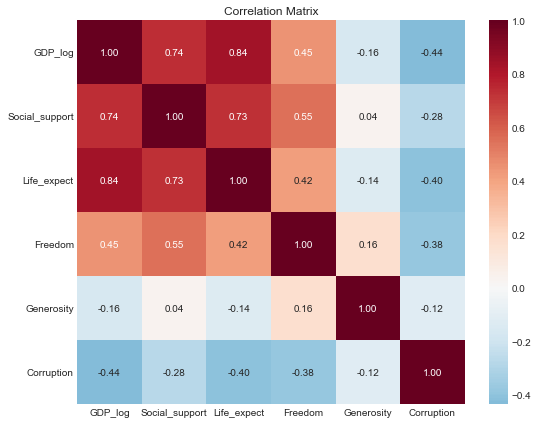

In [53]:
# Correlation matrix
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(data.corr(), annot=True, cmap='RdBu_r', center=0, fmt='.2f', ax=ax)
ax.set_title('Correlation Matrix')
plt.tight_layout()
plt.show()

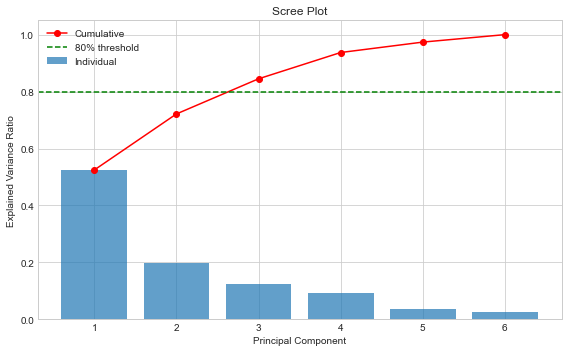

PC1 + PC2 explain 72.1% of variance


In [60]:
# Apply PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(data.select_dtypes(exclude=["object"]))

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Scree plot
fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(range(1, 7), pca.explained_variance_ratio_, alpha=0.7, label='Individual')
ax.plot(range(1, 7), np.cumsum(pca.explained_variance_ratio_), 'ro-', label='Cumulative')
ax.axhline(y=0.8, color='green', linestyle='--', label='80% threshold')
ax.set_xlabel('Principal Component')
ax.set_ylabel('Explained Variance Ratio')
ax.set_title('Scree Plot')
ax.legend()
plt.tight_layout()
plt.show()

print(f"PC1 + PC2 explain {100*sum(pca.explained_variance_ratio_[:2]):.1f}% of variance")

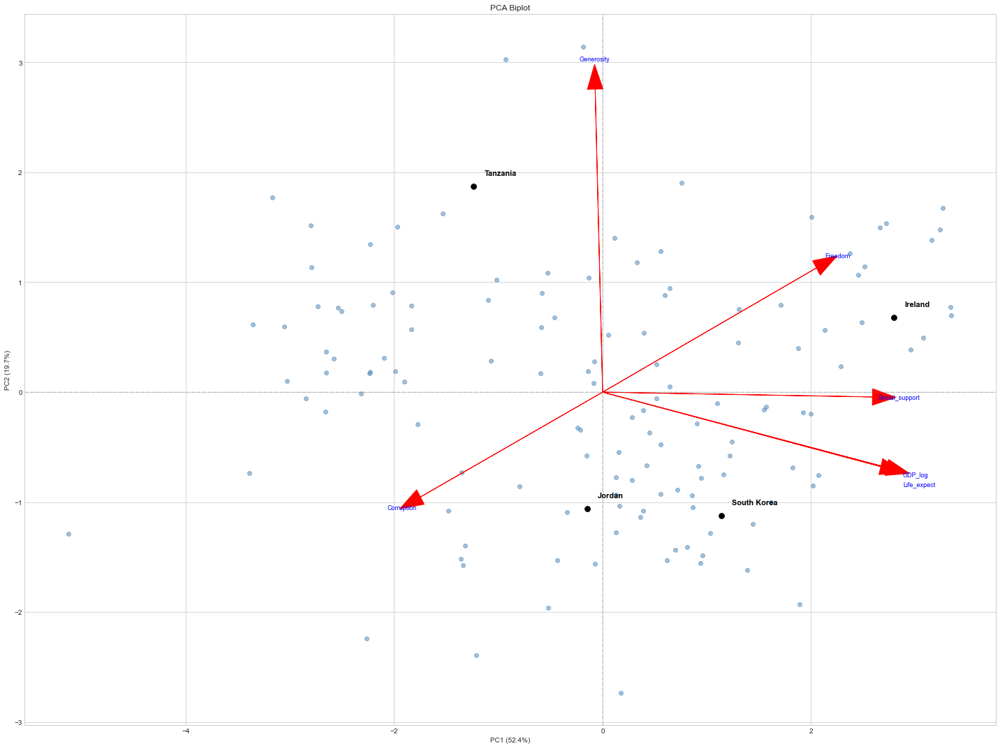

In [66]:
# Loadings (biplot)
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig, ax = plt.subplots(figsize=(20, 15))
ax.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.5, c='steelblue')


scale_factor = 3.3  

for i, var in enumerate(data.select_dtypes(exclude=["object"]).columns):
    x_text = loadings[i, 0] * scale_factor
    y_text = loadings[i, 1] * scale_factor
        
    if 'Life' in var:      
        y_text -= 0.1         
        x_text += 0.1
        
    
    ax.arrow(0, 0, loadings[i, 0]*3, loadings[i, 1]*3, 
             head_width=0.15, color='red')
    
    ax.text(x_text, y_text, var, 
            fontsize=9, color='blue', ha='center', va='center')
ax.set_xlabel(f'PC1 ({100*pca.explained_variance_ratio_[0]:.1f}%)')
ax.set_ylabel(f'PC2 ({100*pca.explained_variance_ratio_[1]:.1f}%)')
ax.set_title('PCA Biplot')
ax.axhline(0, color='gray', linestyle='--', alpha=0.3)
ax.axvline(0, color='gray', linestyle='--', alpha=0.3)
indici_random = random.sample(range(len(data)), 4)
for i in indici_random:
    nome_paese = data.iloc[i]['Country'] 
    x = X_pca[i, 0]
    y = X_pca[i, 1]
    
    ax.text(x + 0.1, y + 0.1, nome_paese, 
            fontsize=11, color='black', weight='bold')
    ax.scatter(x, y, color='black', s=60)
plt.tight_layout()
plt.show()

The horizontal axis (PC1, 52.4%) primarily distinguishes Rich/Developed countries (right) from Developing countries (left). The vertical axis (PC2, 19.7%) seems to capture cultural or 'moral' aspects, such as Generosity.

##  Factor Analysis

Unlike PCA (variance maximization), Factor Analysis models latent variables:

$$\mathbf{X} = \mathbf{L}\mathbf{F} + \boldsymbol{\varepsilon}$$

Where $\mathbf{F}$ are the latent factors and $\boldsymbol{\varepsilon}$ is noise.

**Key Concepts:**
* **Latent Variables:** Unobservable constructs (e.g., "Intelligence", "Anxiety") that cause the observed variables.
* **Rotation:** A technique (e.g., Varimax) used to clarify the relationship between factors and variables, making them easier to interpret.

**Steps:**
1.  **Factor Extraction:** Estimate initial factors (e.g., using Maximum Likelihood or Principal Axis Factoring).
2.  **Factor Rotation:** Rotate the axes (orthogonally or obliquely) to achieve a "Simple Structure" where variables load highly on only one factor.
3.  **Interpretation:** Label the factors based on the variables with the highest loadings.

**When to use:**
* **Latent Constructs:** When you believe underlying, unmeasurable causes drive the data (e.g., Psychometrics, Social Sciences).
* **Noise Modeling:** When you need to explicitly model measurement error ($\boldsymbol{\varepsilon}$), which PCA ignores.
* **Interpretability:** When the goal is to discover meaningful structure rather than just reducing dimensions for compression.

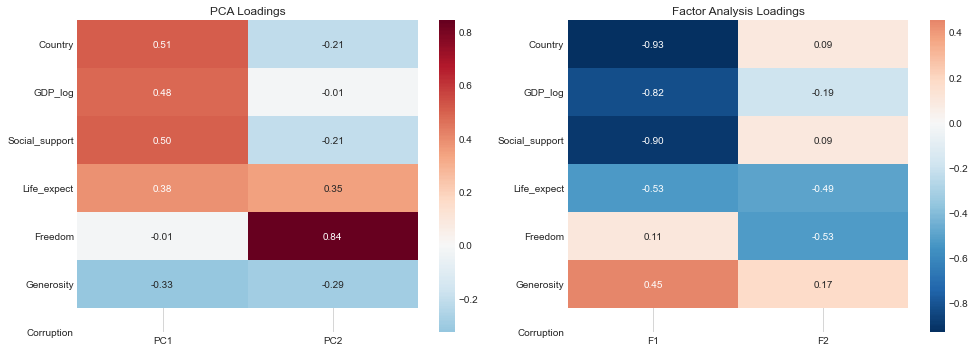

In [72]:
# Factor Analysis
fa = FactorAnalysis(n_components=2, random_state=42)
X_fa = fa.fit_transform(X_scaled)

# Compare loadings
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# PCA loadings
pca_2 = PCA(n_components=2)
pca_2.fit(X_scaled)
sns.heatmap(pca_2.components_.T, annot=True, cmap='RdBu_r', center=0,
            yticklabels=data.columns, xticklabels=['PC1', 'PC2'], ax=axes[0], fmt='.2f')
axes[0].set_title('PCA Loadings')

# FA loadings
sns.heatmap(fa.components_.T, annot=True, cmap='RdBu_r', center=0,
            yticklabels=data.columns, xticklabels=['F1', 'F2'], ax=axes[1], fmt='.2f')
axes[1].set_title('Factor Analysis Loadings')

plt.tight_layout()
plt.show()

PCA scope is Variance Maximization

- PC1 acts as a broad "Development Index," showing moderate positive correlations  across GDP, Social Support, and Life Expectancy.

- PC2 isolates Generosity almost exclusively , identifying it as a distinct dimension unrelated to wealth.

- Key Observation: PCA spreads the variance, creating "averaged" components.

Factor scope is Latent Structure

- F1 identifies a strong underlying cause for development. The loadings are much more intense compared to PCA. This indicates that a single latent variable explains nearly all the variance in GDP and Life Expectancy.

- F2 captures a mix of Freedom and Generosity, suggesting a shared latent driver for these social aspects.

- Key Observation: Factor Analysis produces more "polarized" results, making the hidden factors often easier to interpret conceptually than PCA components.

## ICA (Independent Component Analysis)

ICA separates mixed signals into independent sources (blind source separation).

$$\mathbf{X} = \mathbf{A}\mathbf{S}$$

Goal: recover $\mathbf{S}$ (sources) from $\mathbf{X}$ (mixtures).

Duration: 19.19 seconds
STEP 1: ORIGINAL SOURCES

🎵 SONG 1 (Stupeflip):



🎵 SONG 2 (The Smiths):



🔊 NOISE:



STEP 2: MIXED (everything together - chaos!)

🎧 MIX (all together):



STEP 3: ICA RECOVERY

✨ RECOVERED SOURCE 1:



✨ RECOVERED SOURCE 2:



✨ RECOVERED SOURCE 3:


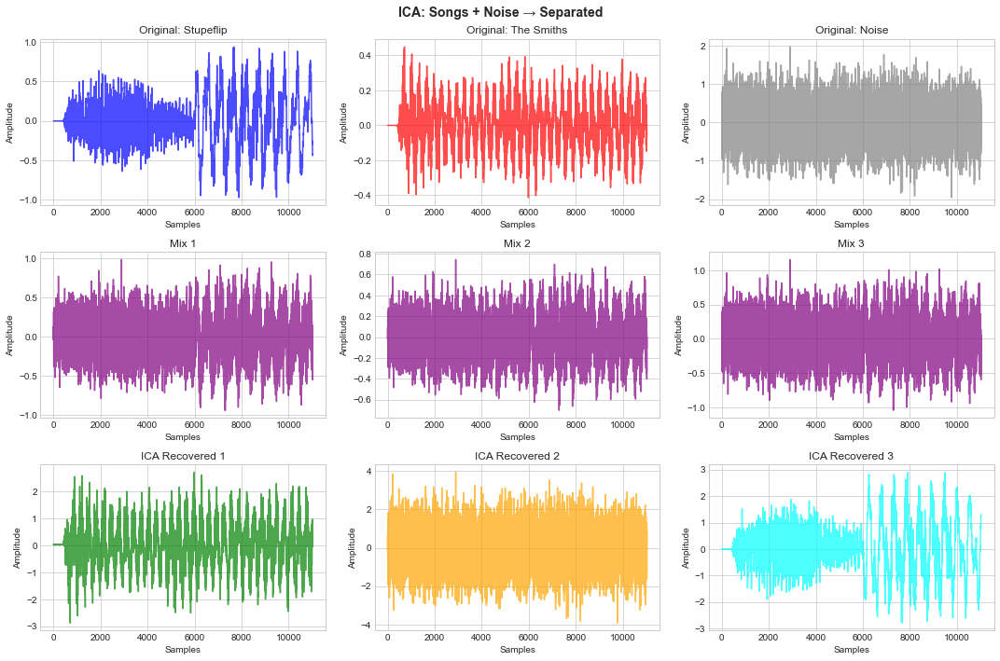

In [85]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import FastICA
from IPython.display import Audio, display
import librosa

# =============================================================================
# 1. LOAD TWO SONGS
# =============================================================================

song1_file = "stupeflip-cropp.mp3"
song2_file = "heavenknows_smiths-cropp.mp3"  

song1, sr = librosa.load(song1_file, sr=22050, mono=True)
song2, _ = librosa.load(song2_file, sr=22050, mono=True)

min_len = min(len(song1), len(song2))
song1 = song1[:min_len]
song2 = song2[:min_len]

song1 = song1 / np.max(np.abs(song1))
song2 = song2 / np.max(np.abs(song2))

def normalize(x):
    return x / np.max(np.abs(x))

print(f"Duration: {min_len / sr:.2f} seconds")

# =============================================================================
# 2. CREATE RANDOM NOISE
# =============================================================================

np.random.seed(42)
noise = np.random.randn(min_len) * 0.5

# =============================================================================
# 3. ORIGINAL SOURCES
# =============================================================================

print("="*60)
print("STEP 1: ORIGINAL SOURCES")
print("="*60)

print("\n🎵 SONG 1 (Stupeflip):")
display(Audio(normalize(song1), rate=sr))

print("\n🎵 SONG 2 (The Smiths):")
display(Audio(normalize(song2), rate=sr))

print("\n🔊 NOISE:")
display(Audio(normalize(noise), rate=sr))

# =============================================================================
# 4. CREATE MIXED SIGNALS (3 mics for 3 sources)
# =============================================================================

print("\n" + "="*60)
print("STEP 2: MIXED (everything together - chaos!)")
print("="*60)

mix1 = 0.5 * song1 + 0.3 * song2 + 0.4 * noise
mix2 = 0.3 * song1 + 0.5 * song2 + 0.3 * noise
mix3 = 0.4 * song1 + 0.4 * song2 + 0.5 * noise

print("\n🎧 MIX (all together):")
display(Audio(normalize(mix1), rate=sr))

# =============================================================================
# 5. ICA SEPARATION
# =============================================================================

print("\n" + "="*60)
print("STEP 3: ICA RECOVERY")
print("="*60)

X_mixed = np.vstack([mix1, mix2, mix3]).T

ica = FastICA(n_components=3, random_state=42, max_iter=1000)
S_recovered = ica.fit_transform(X_mixed)

print("\n✨ RECOVERED SOURCE 1:")
display(Audio(normalize(S_recovered[:, 0]), rate=sr))

print("\n✨ RECOVERED SOURCE 2:")
display(Audio(normalize(S_recovered[:, 1]), rate=sr))

print("\n✨ RECOVERED SOURCE 3:")
display(Audio(normalize(S_recovered[:, 2]), rate=sr))

# =============================================================================
# 6. VISUALIZE
# =============================================================================

fig, axes = plt.subplots(3, 3, figsize=(15, 10))

n_samples = int(0.5 * sr)

# Original
axes[0, 0].plot(song1[:n_samples], 'b', alpha=0.7)
axes[0, 0].set_title('Original: Stupeflip')

axes[0, 1].plot(song2[:n_samples], 'r', alpha=0.7)
axes[0, 1].set_title('Original: The Smiths')

axes[0, 2].plot(noise[:n_samples], 'gray', alpha=0.7)
axes[0, 2].set_title('Original: Noise')

# Mixed
axes[1, 0].plot(mix1[:n_samples], 'purple', alpha=0.7)
axes[1, 0].set_title('Mix 1')

axes[1, 1].plot(mix2[:n_samples], 'purple', alpha=0.7)
axes[1, 1].set_title('Mix 2')

axes[1, 2].plot(mix3[:n_samples], 'purple', alpha=0.7)
axes[1, 2].set_title('Mix 3')

# Recovered
axes[2, 0].plot(S_recovered[:n_samples, 0], 'green', alpha=0.7)
axes[2, 0].set_title('ICA Recovered 1')

axes[2, 1].plot(S_recovered[:n_samples, 1], 'orange', alpha=0.7)
axes[2, 1].set_title('ICA Recovered 2')

axes[2, 2].plot(S_recovered[:n_samples, 2], 'cyan', alpha=0.7)
axes[2, 2].set_title('ICA Recovered 3')

for ax in axes.flat:
    ax.set_xlabel('Samples')
    ax.set_ylabel('Amplitude')

plt.suptitle('ICA: Songs + Noise → Separated', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()



#####################################
##            Your Turn!           ##
#PCA INSTEAD OF ICA - DOES IT WORK?##
#####################################

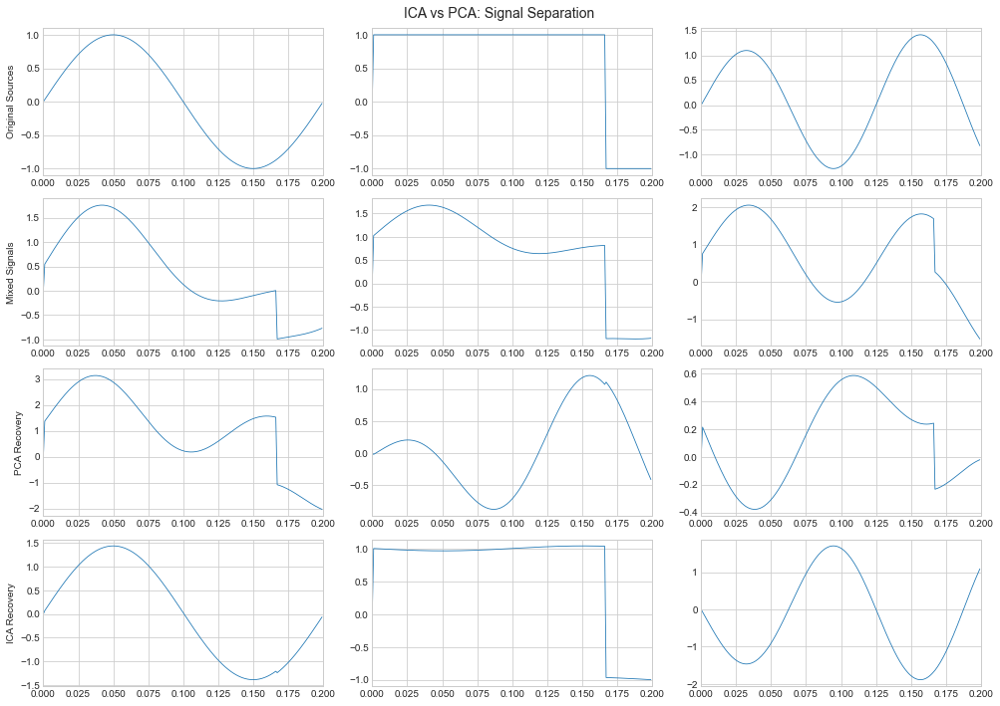

ICA recovers the original signals, PCA does not!


In [27]:
# Visualize
fig, axes = plt.subplots(4, 3, figsize=(14, 10))

titles = ['Original Sources', 'Mixed Signals', 'PCA Recovery', 'ICA Recovery']
signals = [S, X_mixed, S_pca, S_recovered]

for row, (title, sig) in enumerate(zip(titles, signals)):
    for col in range(3):
        axes[row, col].plot(t[:200], sig[:200, col], linewidth=0.8)
        if col == 0:
            axes[row, col].set_ylabel(title)
        axes[row, col].set_xlim([0, 0.2])

plt.suptitle('ICA vs PCA: Signal Separation', fontsize=14)
plt.tight_layout()
plt.show()

print("ICA recovers the original signals, PCA does not!")

## MCA (Multiple Correspondence Analysis)

MCA is PCA for categorical data. It finds associations between categories.

In [89]:
# Survey data (categorical)
np.random.seed(42)
n = 500

survey = pd.DataFrame({
    'outlook': np.random.choice(['Positive', 'Neutral', 'Negative'], n, p=[0.3, 0.4, 0.3]),
    'job_market': np.random.choice(['Good', 'Fair', 'Poor'], n, p=[0.25, 0.5, 0.25]),
    'invest_intent': np.random.choice(['Increase', 'Same', 'Decrease'], n, p=[0.3, 0.4, 0.3]),
    'age_group': np.random.choice(['18-30', '31-50', '51+'], n, p=[0.3, 0.4, 0.3]),
    'education': np.random.choice(['High School', 'Bachelor', 'Graduate'], n, p=[0.3, 0.4, 0.3]),
    'region': np.random.choice(['North', 'South', 'East', 'West'], n)
})

print(f"Survey: {n} respondents, {len(survey.columns)} questions")
survey.head()

Survey: 500 respondents, 6 questions


,outlook,job_market,invest_intent,age_group,education,region
0,Neutral,Fair,Increase,31-50,High School,East
1,Negative,Fair,Same,31-50,High School,East
2,Negative,Fair,Decrease,18-30,Graduate,East
3,Neutral,Poor,Decrease,31-50,High School,East
4,Positive,Fair,Decrease,31-50,High School,West


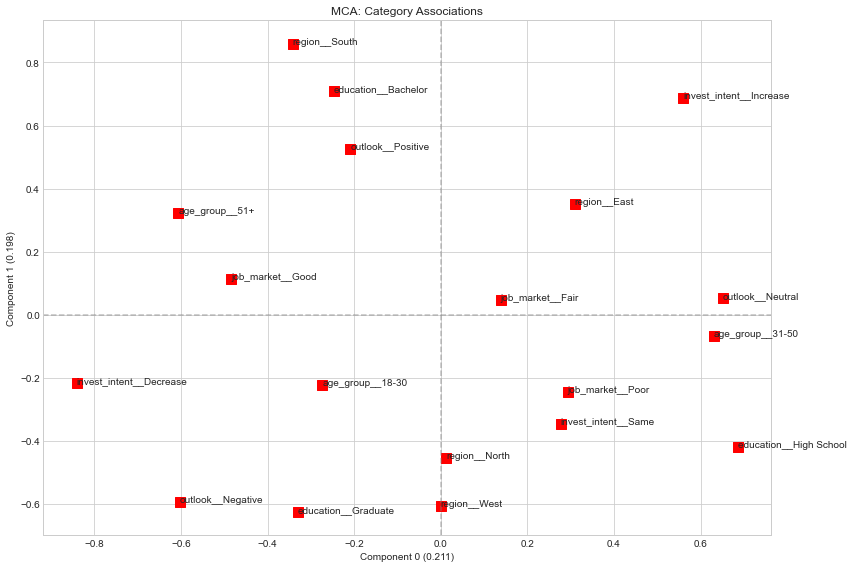

In [90]:
# Apply MCA
mca = prince.MCA(n_components=2, random_state=42)
mca = mca.fit(survey)

# Plot using the correct method
fig, ax = plt.subplots(figsize=(12, 8))

# Get coordinates
row_coords = mca.row_coordinates(survey)
col_coords = mca.column_coordinates(survey)

# Plot column markers (categories)
ax.scatter(col_coords[0], col_coords[1], c='red', s=100, marker='s')
for i, label in enumerate(col_coords.index):
    ax.annotate(label, (col_coords[0].iloc[i], col_coords[1].iloc[i]))

# Option A: Using eigenvalues
ax.set_xlabel(f'Component 0 ({mca.eigenvalues_[0]:.3f})')
ax.set_ylabel(f'Component 1 ({mca.eigenvalues_[1]:.3f})')

# Option B: If percentage_of_variance_ exists in your version
# ax.set_xlabel(f'Component 0 ({mca.percentage_of_variance_[0]:.1f}%)')
# ax.set_ylabel(f'Component 1 ({mca.percentage_of_variance_[1]:.1f}%)')

ax.set_title('MCA: Category Associations')
ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
ax.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

- Top-right (+,+): Optimistic, educated (Bachelor), East region, increasing investments
- Top-left (-,+): Older (51+), South region, positive job market perception
- Bottom-right (+,-): Middle-aged (31-50), High School education, poor job market view, stable investments
- Bottom-left (-,-): Graduates with negative outlook decreasing investments (counterintuitive pattern)
- Distance from center: Far = distinctive categories; Near = neutral/common categories

# Non Linear Methods

## Kernel PCA

- The Problem: Standard PCA is strictly linear. It tries to reduce dimensions by finding straight lines (hyperplanes). If your data has curved structures (like a spiral or concentric circles), standard PCA fails to capture them.

- The Solution: Kernel PCA projects the data into a higher-dimensional space where these curved patterns become linear and easier to separate.

- The "Kernel Trick"

Actually transforming data into higher dimensions is computationally expensive. Kernel PCA uses a shortcut called the **Kernel Trick**. It calculates the relationship (similarity) between data points in the higher dimension without actually transforming the data points themselves.

$K(x,y)≈Similarity$ in high dimensions

- Common Kernels

The "Kernel" is the function that defines the shape of this new space:

- Linear Kernel:
    - K(x,y)=xTy

    - Usage: Equivalent to standard PCA. Used as a baseline to check if non-linearity is actually needed.

- RBF (Radial Basis Function):
    - K(x,y)=exp(−γ∣∣x−y∣∣2)

    - Usage: The most popular choice. It "lifts" data into infinite dimensions. Excellent for separating complex clusters (e.g., circles inside circles).

- Polynomial Kernel:
    - K(x,y)=(xTy+c)d

    - Usage: Best when data follows specific curved shapes (polynomial trends).

- Sigmoid Kernel:
    - K(x,y)=tanh(γxTy+c)

    - Usage: behaves similarly to a Neural Network (Multilayer Perceptron).

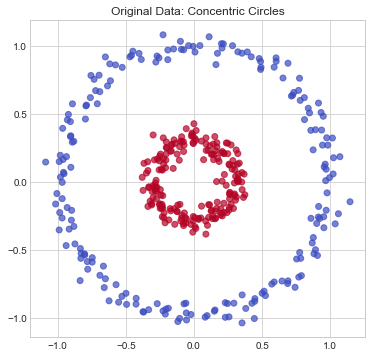

In [91]:
# Create non-linear data: concentric circles
X_circles, y_circles = make_circles(n_samples=400, factor=0.3, noise=0.05, random_state=42)

fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(X_circles[:, 0], X_circles[:, 1], c=y_circles, cmap='coolwarm', alpha=0.7)
ax.set_title('Original Data: Concentric Circles')
ax.set_aspect('equal')
plt.show()

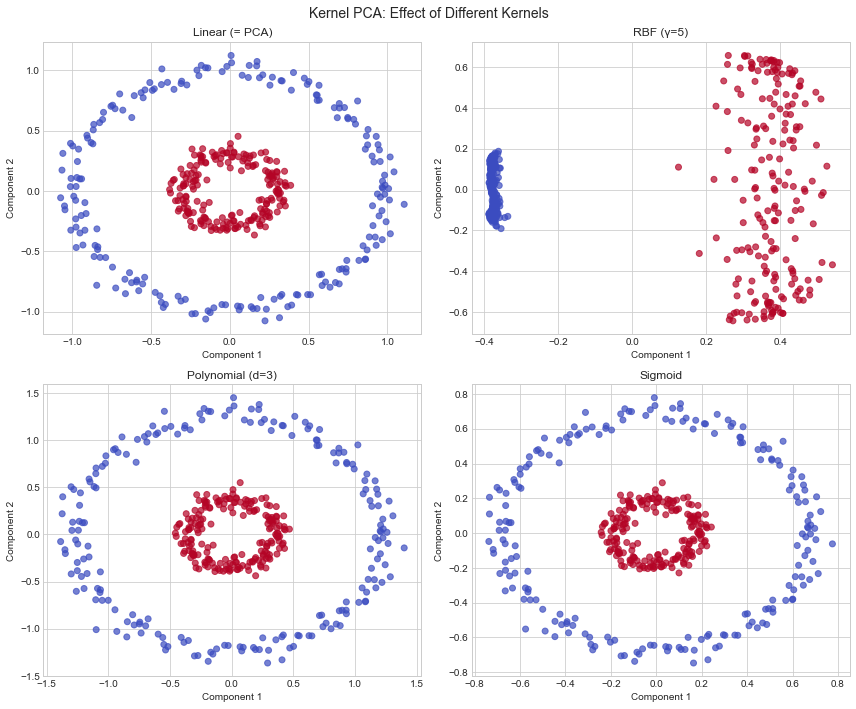

Linear PCA cannot separate the circles, but RBF kernel can!


In [92]:
# Compare different kernels
kernels = [
    ('Linear (= PCA)', 'linear', {}),
    ('RBF (γ=5)', 'rbf', {'gamma': 5}),
    ('Polynomial (d=3)', 'poly', {'degree': 3}),
    ('Sigmoid', 'sigmoid', {'gamma': 1})
]

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for ax, (name, kernel, params) in zip(axes.flat, kernels):
    kpca = KernelPCA(n_components=2, kernel=kernel, **params)
    X_kpca = kpca.fit_transform(X_circles)
    
    ax.scatter(X_kpca[:, 0], X_kpca[:, 1], c=y_circles, cmap='coolwarm', alpha=0.7)
    ax.set_title(f'{name}')
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')

plt.suptitle('Kernel PCA: Effect of Different Kernels', fontsize=14)
plt.tight_layout()
plt.show()

print("Linear PCA cannot separate the circles, but RBF kernel can!")

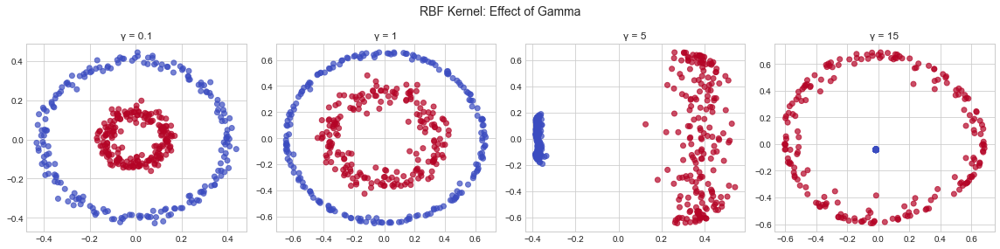

In [93]:
# Effect of gamma parameter (RBF kernel)
gammas = [0.1, 1, 5, 15]

fig, axes = plt.subplots(1, 4, figsize=(16, 4))

for ax, gamma in zip(axes, gammas):
    kpca = KernelPCA(n_components=2, kernel='rbf', gamma=gamma)
    X_kpca = kpca.fit_transform(X_circles)
    
    ax.scatter(X_kpca[:, 0], X_kpca[:, 1], c=y_circles, cmap='coolwarm', alpha=0.7)
    ax.set_title(f'γ = {gamma}')

plt.suptitle('RBF Kernel: Effect of Gamma', fontsize=14)
plt.tight_layout()
plt.show()

# t-SNE

While PCA focuses on global structure (variance), t-SNE is designed to preserve local structure. It is excellent for visualizing high-dimensional clusters in 2D or 3D.
Why "t-Distributed"? (The Crowding Problem)

The "t" stands for the Student's t-distribution.

- In High-Dimensions: There is a lot of volume/space. t-SNE uses a Gaussian distribution to measure distances here.

- In Low-Dimensions (2D): There is much less space available. If we used a Gaussian here too, points would pile up on top of each other.

- The Solution: In the 2D map, t-SNE uses a t-distribution. It has "heavier tails" (it is flatter) and acts like a repulsive force, pushing points slightly apart in this way this solves the Crowding Problem, making clusters distinct rather than a messy blob.


1. KL Divergence (The Cost Function) t-SNE moves points around to minimize the Kullback-Leibler Divergence.

      - Concept: It measures the difference between the probability distribution in the original space (P) and the one in the map (Q).

      - Goal: Minimizing KL Divergence ensures that if two points are neighbors in the original data, they stay neighbors in the visualization.

2. Perplexity (The Main Parameter) This parameter controls the "effective number of neighbors" each point considers.

    - Low Perplexity (5-30): Focuses on very local details (can split clusters into small groups).

    - High Perplexity (30-50+): Considers a wider perspective (preserves more global shape).
    
    
### Kullback-Leibler (KL) Divergence Formula

In t-SNE, the KL Divergence serves as the **cost function** ($C$) that the algorithm minimizes. It calculates the sum of differences between the probability distributions of the original space and the embedded space.

$$
C = KL(P || Q) = \sum_{i} \sum_{j \neq i} p_{ij} \log \frac{p_{ij}}{q_{ij}}
$$

**Where:**
* $p_{ij}$: The similarity probability between points $x_i$ and $x_j$ in the **high-dimensional space** (Gaussian).
* $q_{ij}$: The similarity probability between points $y_i$ and $y_j$ in the **low-dimensional space** (Student's t-distribution).

**Interpretation:**
If two points are close in the original space ($p_{ij}$ is large) but mapped far apart in the visualization ($q_{ij}$ is small), the $\log$ term becomes large, resulting in a high cost. This forces the algorithm to keep neighbors together.




Digits: 1797 samples, 64 features (8x8 pixels)


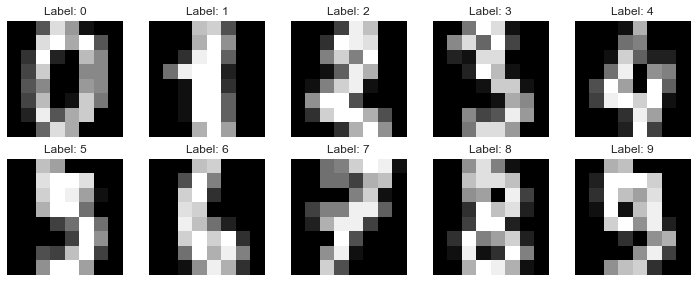

In [94]:
# Load digits dataset
digits = load_digits()
X_digits = digits.data
y_digits = digits.target

print(f"Digits: {X_digits.shape[0]} samples, {X_digits.shape[1]} features (8x8 pixels)")

# Show some examples
fig, axes = plt.subplots(2, 5, figsize=(10, 4))
for i, ax in enumerate(axes.flat):
    ax.imshow(digits.images[i], cmap='gray')
    ax.set_title(f'Label: {y_digits[i]}')
    ax.axis('off')
plt.tight_layout()
plt.show()

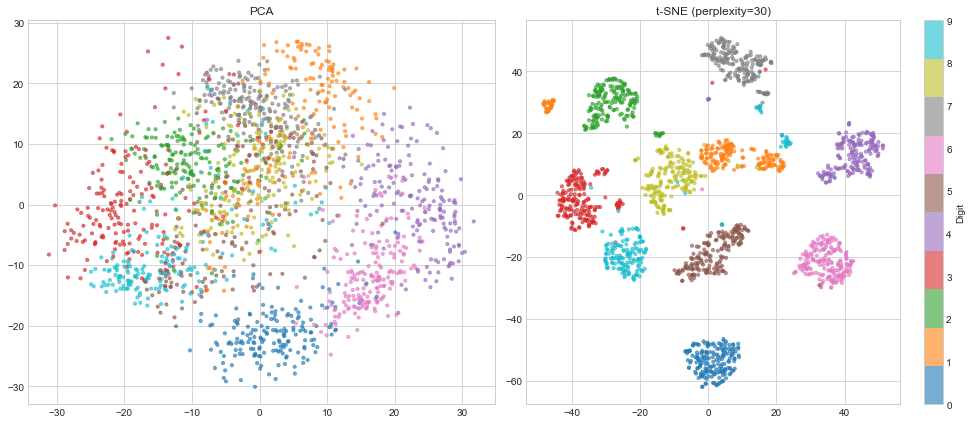

In [95]:
# Compare PCA vs t-SNE
pca_digits = PCA(n_components=2)
X_pca_digits = pca_digits.fit_transform(X_digits)

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_digits)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

scatter1 = axes[0].scatter(X_pca_digits[:, 0], X_pca_digits[:, 1], c=y_digits, cmap='tab10', alpha=0.6, s=10)
axes[0].set_title('PCA')

scatter2 = axes[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_digits, cmap='tab10', alpha=0.6, s=10)
axes[1].set_title('t-SNE (perplexity=30)')

plt.colorbar(scatter2, ax=axes[1], label='Digit')
plt.tight_layout()
plt.show()

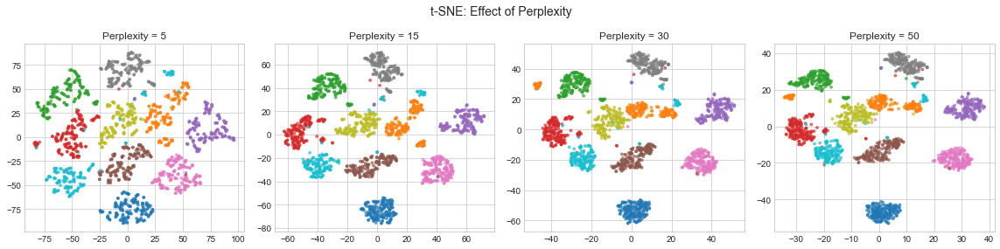

In [96]:
# Effect of perplexity
perplexities = [5, 15, 30, 50]

fig, axes = plt.subplots(1, 4, figsize=(16, 4))

for ax, perp in zip(axes, perplexities):
    tsne = TSNE(n_components=2, perplexity=perp, random_state=42)
    X_tsne = tsne.fit_transform(X_digits)
    ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_digits, cmap='tab10', alpha=0.6, s=8)
    ax.set_title(f'Perplexity = {perp}')

plt.suptitle('t-SNE: Effect of Perplexity', fontsize=14)
plt.tight_layout()
plt.show()

##  UMAP - Uniform manifold approximation and projection

UMAP is often seen as the "modern successor" to t-SNE. While t-SNE is great at grouping similar items together, UMAP is much faster and better at preserving the "big picture" relationships in your data.


Key parameters:
- **n_neighbors**: local vs global structure; is the "zoom" level. It controls how much of the surrounding data each points looks at. Low values makes the algorithm focus on very local details, while high values allows to focus on the big picture, which is great for seeing how different groups connect to each other.

- **min_dist**: how tightly points cluster; is the "personal space". It controls how tightly points are allowed to pack together. Low values allows for distinct clustering, high values instead allow for seeing the internal structure of a cluster.



Why use UMAP over t-SNE?

- Speed: It is significantly faster, making it suitable for very large datasets.

- Global Structure: It keeps distant clusters in meaningful relative positions, whereas t-SNE might place them randomly.

- Consistency: If you run it twice, you get similar results (unlike t-SNE, which changes every time).


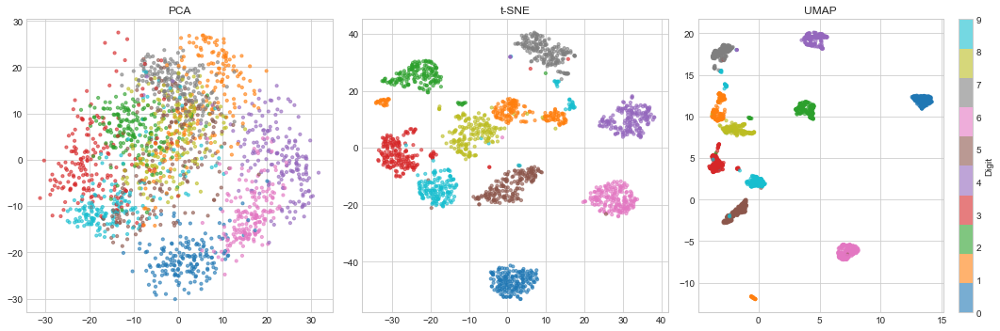

In [97]:
# UMAP on digits
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = reducer.fit_transform(X_digits)

# Compare all three
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].scatter(X_pca_digits[:, 0], X_pca_digits[:, 1], c=y_digits, cmap='tab10', alpha=0.6, s=10)
axes[0].set_title('PCA')

axes[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_digits, cmap='tab10', alpha=0.6, s=10)
axes[1].set_title('t-SNE')

scatter = axes[2].scatter(X_umap[:, 0], X_umap[:, 1], c=y_digits, cmap='tab10', alpha=0.6, s=10)
axes[2].set_title('UMAP')

plt.colorbar(scatter, ax=axes[2], label='Digit')
plt.tight_layout()
plt.show()

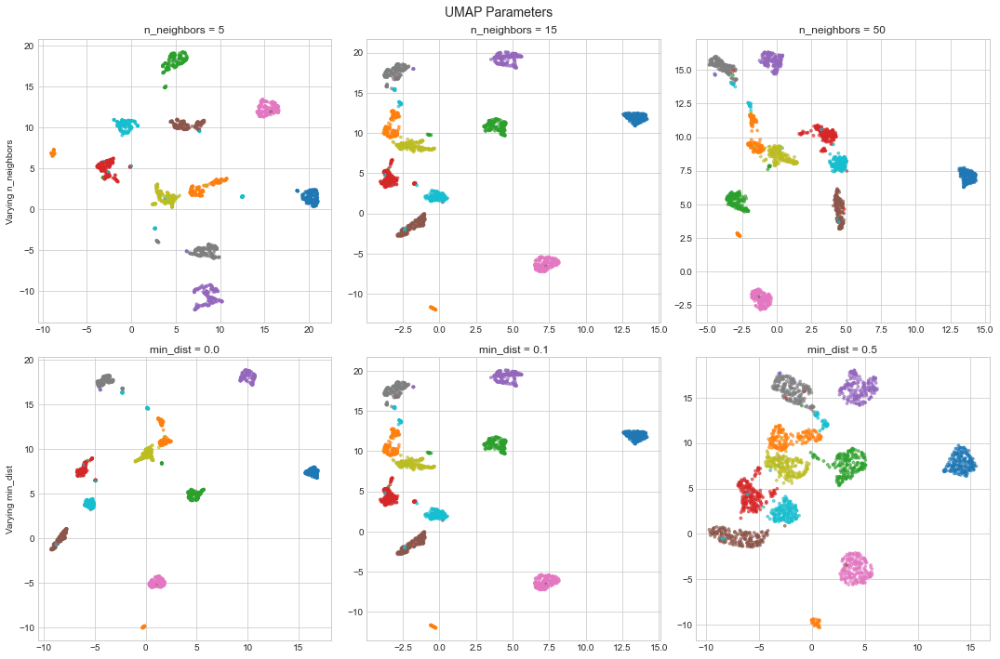

In [98]:
# UMAP parameters exploration
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# n_neighbors effect
for ax, n_neigh in zip(axes[0], [5, 15, 50]):
    reducer = umap.UMAP(n_neighbors=n_neigh, min_dist=0.1, random_state=42)
    X_umap = reducer.fit_transform(X_digits)
    ax.scatter(X_umap[:, 0], X_umap[:, 1], c=y_digits, cmap='tab10', alpha=0.6, s=8)
    ax.set_title(f'n_neighbors = {n_neigh}')

# min_dist effect
for ax, min_d in zip(axes[1], [0.0, 0.1, 0.5]):
    reducer = umap.UMAP(n_neighbors=15, min_dist=min_d, random_state=42)
    X_umap = reducer.fit_transform(X_digits)
    ax.scatter(X_umap[:, 0], X_umap[:, 1], c=y_digits, cmap='tab10', alpha=0.6, s=8)
    ax.set_title(f'min_dist = {min_d}')

axes[0, 0].set_ylabel('Varying n_neighbors')
axes[1, 0].set_ylabel('Varying min_dist')
plt.suptitle('UMAP Parameters', fontsize=14)
plt.tight_layout()
plt.show()

t-SNE and UMAP operate roughly in the same way:

- Compute high dimensional probabilities p.
- Compute low dimensional probabilities q.
- Calculate the difference between the probabilities by a given cost function C(p,q).
- Minimize the cost function.


---
# Anomaly Detection 

These algorithms learn the structure of "normal" data to identify rare events or outliers, without requiring labeled examples.
How they work

- Isolation Forest: It detects anomalies by randomly "slicing" the data. Because anomalies are few and different, they are easier to isolate (they require fewer cuts to be separated) than normal points. 

        Analogy: It’s easier to describe a distinct red ball in a bucket of white balls than to describe one specific white ball.

- Local Outlier Factor (LOF) It looks at the density of data points. It identifies points that have a significantly lower density than their surrounding neighbors.

        Analogy: A person standing alone in an empty field, while everyone else is crowded in a stadium.

- One-Class SVM It learns a tight geometric boundary (like a circle or sphere) that wraps around the normal data. Anything falling outside this boundary is flagged as an anomaly.

        Analogy: A bouncer putting a velvet rope around the VIP section; anyone outside the rope is an "outlier."

- Elliptic Envelope It assumes the normal data follows a standard statistical shape (a Gaussian distribution). It fits an ellipse around the central data points and ignores those far from the center.

        Analogy: Drawing a circle around the bullseye of a target; shots that hit the wall are outliers.

In [99]:
# Create transaction data with anomalies
np.random.seed(42)

# Normal transactions
n_normal = 950
normal = np.column_stack([
    np.random.exponential(100, n_normal),           # amount
    np.random.normal(14, 4, n_normal).clip(0, 24),  # hour
    np.random.exponential(5, n_normal),             # distance from home
    np.random.exponential(3, n_normal)              # days since last
])

# Anomalous transactions
n_anomaly = 50
anomalies = np.column_stack([
    np.random.exponential(500, n_anomaly),          # higher amounts
    np.random.choice([2, 3, 4, 22, 23], n_anomaly), # unusual hours
    np.random.exponential(50, n_anomaly),           # far from home
    np.random.exponential(30, n_anomaly)            # long gaps
])

X_transactions = np.vstack([normal, anomalies])
y_true = np.array([0]*n_normal + [1]*n_anomaly)  # 0=normal, 1=anomaly

# Standardize
scaler = StandardScaler()
X_trans_scaled = scaler.fit_transform(X_transactions)

print(f"Dataset: {len(X_transactions)} transactions, {n_anomaly} anomalies ({100*n_anomaly/len(X_transactions):.1f}%)")

Dataset: 1000 transactions, 50 anomalies (5.0%)


In [100]:
# Apply all methods
contamination = 0.05

models = {
    'Isolation Forest': IsolationForest(contamination=contamination, random_state=42),
    'Local Outlier Factor': LocalOutlierFactor(n_neighbors=20, contamination=contamination, novelty=False),
    'One-Class SVM': OneClassSVM(kernel='rbf', nu=contamination),
    'Elliptic Envelope': EllipticEnvelope(contamination=contamination, random_state=42)
}

predictions = {}
for name, model in models.items():
    if name == 'Local Outlier Factor':
        pred = model.fit_predict(X_trans_scaled)
    else:
        pred = model.fit_predict(X_trans_scaled)
    # Convert to 0/1 (sklearn uses 1=normal, -1=anomaly)
    predictions[name] = (pred == -1).astype(int)

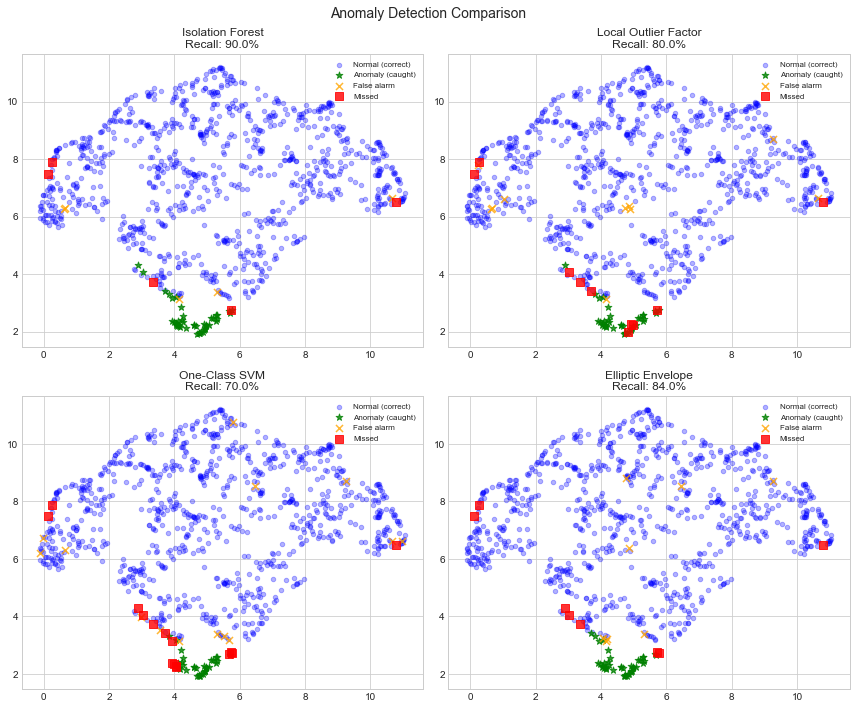

In [101]:
# Visualize with UMAP
reducer = umap.UMAP(n_neighbors=15, random_state=42)
X_trans_2d = reducer.fit_transform(X_trans_scaled)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for ax, (name, pred) in zip(axes.flat, predictions.items()):
    # True negatives (normal, predicted normal)
    tn = (y_true == 0) & (pred == 0)
    # True positives (anomaly, predicted anomaly)
    tp = (y_true == 1) & (pred == 1)
    # False positives (normal, predicted anomaly)
    fp = (y_true == 0) & (pred == 1)
    # False negatives (anomaly, predicted normal)
    fn = (y_true == 1) & (pred == 0)
    
    ax.scatter(X_trans_2d[tn, 0], X_trans_2d[tn, 1], c='blue', alpha=0.3, s=20, label='Normal (correct)')
    ax.scatter(X_trans_2d[tp, 0], X_trans_2d[tp, 1], c='green', alpha=0.8, s=50, marker='*', label='Anomaly (caught)')
    ax.scatter(X_trans_2d[fp, 0], X_trans_2d[fp, 1], c='orange', alpha=0.8, s=50, marker='x', label='False alarm')
    ax.scatter(X_trans_2d[fn, 0], X_trans_2d[fn, 1], c='red', alpha=0.8, s=50, marker='s', label='Missed')
    
    recall = tp.sum() / (tp.sum() + fn.sum())
    ax.set_title(f'{name}\nRecall: {recall:.1%}')
    ax.legend(loc='upper right', fontsize=8)

plt.suptitle('Anomaly Detection Comparison', fontsize=14)
plt.tight_layout()
plt.show()

In [102]:
# Summary metrics
from sklearn.metrics import precision_score, recall_score, f1_score

print("Performance Comparison:")
print("="*50)
print(f"{'Method':<25} {'Precision':>10} {'Recall':>10} {'F1':>10}")
print("-"*50)

for name, pred in predictions.items():
    prec = precision_score(y_true, pred)
    rec = recall_score(y_true, pred)
    f1 = f1_score(y_true, pred)
    print(f"{name:<25} {prec:>10.1%} {rec:>10.1%} {f1:>10.1%}")

Performance Comparison:
Method                     Precision     Recall         F1
--------------------------------------------------
Isolation Forest               90.0%      90.0%      90.0%
Local Outlier Factor           80.0%      80.0%      80.0%
One-Class SVM                  71.4%      70.0%      70.7%
Elliptic Envelope              84.0%      84.0%      84.0%


---
# Summary

| Method | Type | Best For |
|--------|------|----------|
| PCA | Linear | Interpretability, preprocessing |
| Factor Analysis | Linear | Latent variable modeling |
| ICA | Linear | Signal separation |
| MCA | Linear | Categorical data |
| Kernel PCA | Non-linear | Non-linear patterns |
| t-SNE | Non-linear | Visualization |
| UMAP | Non-linear | Visualization + speed |
| Isolation Forest | Anomaly | General anomaly detection |

# Python example code

In [119]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Settings for better plots
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (10, 6)

In [108]:
df = pd.read_csv("Mall_Customers.csv")
print("Dataset shape:", df.shape)
print("\nFirst rows:")
df.head(10)

Dataset shape: (200, 5)

First rows:


,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
5,6,Female,22,17,76
6,7,Female,35,18,6
7,8,Female,23,18,94
8,9,Male,64,19,3
9,10,Female,30,19,72


In [109]:
# Basic info
print("Column types:")
print(df.dtypes)
print("\nMissing values:")
print(df.isnull().sum())
print("\nDescriptive statistics:")
df.describe()

Column types:
CustomerID                 int64
Genre                     object
Age                        int64
Annual Income (k$)         int64
Spending Score (1-100)     int64
dtype: object

Missing values:
CustomerID                0
Genre                     0
Age                       0
Annual Income (k$)        0
Spending Score (1-100)    0
dtype: int64

Descriptive statistics:


,CustomerID,Age,Annual Income (k$),Spending Score (1-100)
count,200.000000,200.000000,200.000000,200.000000
mean,100.500000,38.850000,60.560000,50.200000
std,57.879185,13.969007,26.264721,25.823522
min,1.000000,18.000000,15.000000,1.000000
25%,50.750000,28.750000,41.500000,34.750000
50%,100.500000,36.000000,61.500000,50.000000
75%,150.250000,49.000000,78.000000,73.000000
max,200.000000,70.000000,137.000000,99.000000


In [110]:
# Select numeric features
features = ['Age', 'Annual Income (k$)', 'Spending Score (1-100)']
X = df[features].copy()

print("Features selected:")
print(X.head())

Features selected:
   Age  Annual Income (k$)  Spending Score (1-100)
0   19                  15                      39
1   21                  15                      81
2   20                  16                       6
3   23                  16                      77
4   31                  17                      40


In [111]:
# Standardize the data (important for PCA and K-Means!)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Convert to DataFrame for readability
X_scaled_df = pd.DataFrame(X_scaled, columns=features)
print("Scaled data (mean=0, std=1):")
print(X_scaled_df.describe().round(2))

Scaled data (mean=0, std=1):
          Age  Annual Income (k$)  Spending Score (1-100)
count  200.00              200.00                  200.00
mean    -0.00               -0.00                   -0.00
std      1.00                1.00                    1.00
min     -1.50               -1.74                   -1.91
25%     -0.72               -0.73                   -0.60
50%     -0.20                0.04                   -0.01
75%      0.73                0.67                    0.89
max      2.24                2.92                    1.89


**PCA: Principal Component Analysis**

In [112]:
# Apply PCA with all components (to see explained variance)
pca_full = PCA()
pca_full.fit(X_scaled)

# Explained variance ratio
explained_variance = pca_full.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

print("Explained variance by each component:")
for i, (var, cum) in enumerate(zip(explained_variance, cumulative_variance)):
    print(f"  PC{i+1}: {var:.4f} ({var*100:.2f}%)  |  Cumulative: {cum:.4f} ({cum*100:.2f}%)")

Explained variance by each component:
  PC1: 0.4427 (44.27%)  |  Cumulative: 0.4427 (44.27%)
  PC2: 0.3331 (33.31%)  |  Cumulative: 0.7757 (77.57%)
  PC3: 0.2243 (22.43%)  |  Cumulative: 1.0000 (100.00%)


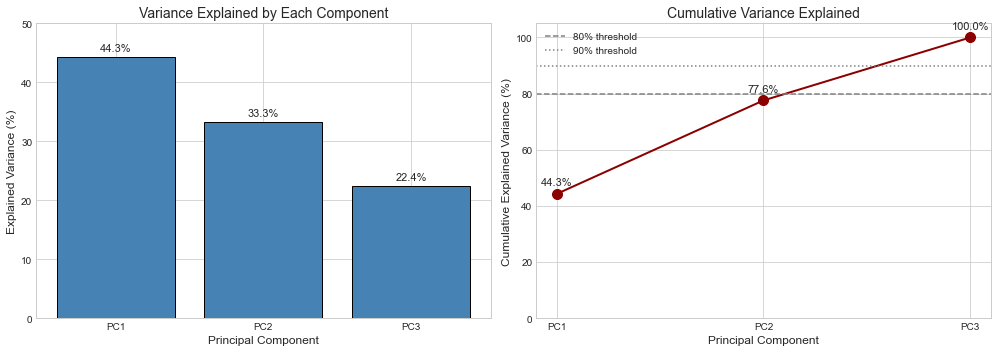

In [113]:
# Plot explained variance
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bar plot: individual variance
ax1 = axes[0]
components = [f'PC{i+1}' for i in range(len(explained_variance))]
bars = ax1.bar(components, explained_variance * 100, color='steelblue', edgecolor='black')
ax1.set_ylabel('Explained Variance (%)', fontsize=12)
ax1.set_xlabel('Principal Component', fontsize=12)
ax1.set_title('Variance Explained by Each Component', fontsize=14)
ax1.set_ylim(0, 50)

# Add values on bars
for bar, val in zip(bars, explained_variance):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, 
             f'{val*100:.1f}%', ha='center', fontsize=11)

# Line plot: cumulative variance
ax2 = axes[1]
ax2.plot(components, cumulative_variance * 100, 'o-', color='darkred', linewidth=2, markersize=10)
ax2.axhline(y=80, color='gray', linestyle='--', label='80% threshold')
ax2.axhline(y=90, color='gray', linestyle=':', label='90% threshold')
ax2.set_ylabel('Cumulative Explained Variance (%)', fontsize=12)
ax2.set_xlabel('Principal Component', fontsize=12)
ax2.set_title('Cumulative Variance Explained', fontsize=14)
ax2.set_ylim(0, 105)
ax2.legend()

# Add values on points
for i, val in enumerate(cumulative_variance):
    ax2.text(i, val*100 + 3, f'{val*100:.1f}%', ha='center', fontsize=11)

plt.tight_layout()
plt.savefig('pca_variance_explained.png', dpi=150, bbox_inches='tight')
plt.show()

In [115]:
# PCA component loadings (how each original feature contributes to each PC)
loadings = pd.DataFrame(
    pca_full.components_.T,
    columns=['PC1', 'PC2', 'PC3'],
    index=features
)

print("PCA Loadings (contribution of each feature to each component):")
print(loadings.round(3))
print("\nInterpretation:")
print("- PC1: Mainly captures Annual Income and Spending Score (opposite signs = spending behavior)")
print("- PC2: Mainly captures Age")
print("- PC3: Captures remaining variance")

PCA Loadings (contribution of each feature to each component):
                          PC1    PC2    PC3
Age                     0.706  0.030  0.707
Annual Income (k$)     -0.048  0.999  0.005
Spending Score (1-100) -0.706 -0.038  0.707

Interpretation:
- PC1: Mainly captures Annual Income and Spending Score (opposite signs = spending behavior)
- PC2: Mainly captures Age
- PC3: Captures remaining variance


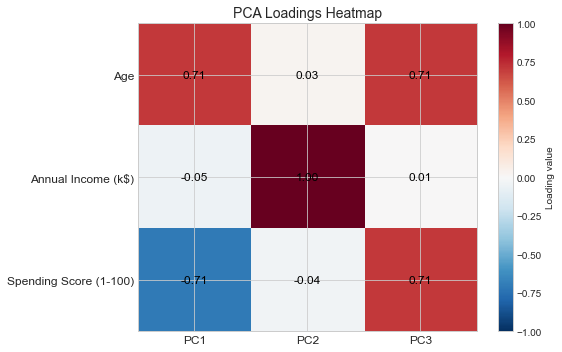

In [116]:
# Visualize loadings as heatmap
fig, ax = plt.subplots(figsize=(8, 5))
im = ax.imshow(loadings.values, cmap='RdBu_r', aspect='auto', vmin=-1, vmax=1)

# Labels
ax.set_xticks(range(len(loadings.columns)))
ax.set_xticklabels(loadings.columns, fontsize=12)
ax.set_yticks(range(len(loadings.index)))
ax.set_yticklabels(loadings.index, fontsize=12)
ax.set_title('PCA Loadings Heatmap', fontsize=14)

# Add values in cells
for i in range(len(loadings.index)):
    for j in range(len(loadings.columns)):
        text = ax.text(j, i, f'{loadings.values[i, j]:.2f}',
                       ha='center', va='center', color='black', fontsize=12)

plt.colorbar(im, label='Loading value')
plt.tight_layout()
plt.savefig('pca_loadings_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

In [117]:
# Transform data to 2D and 3D
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_scaled)

pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)

print(f"Original shape: {X_scaled.shape}")
print(f"2D PCA shape: {X_pca_2d.shape}")
print(f"3D PCA shape: {X_pca_3d.shape}")

Original shape: (200, 3)
2D PCA shape: (200, 2)
3D PCA shape: (200, 3)


**K-Means Clustering**

First, we find the optimal number of clusters using the Elbow Method and Silhouette Score.

In [120]:
# Find optimal K using Elbow Method and Silhouette Score
K_range = range(2, 11)
inertias = []
silhouette_scores = []

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_scaled, kmeans.labels_))

# Display results
print("K\tInertia\t\tSilhouette")
print("-" * 35)
for k, inertia, sil in zip(K_range, inertias, silhouette_scores):
    print(f"{k}\t{inertia:.2f}\t\t{sil:.4f}")

K	Inertia		Silhouette
-----------------------------------
2	389.39		0.3355
3	295.21		0.3578
4	205.23		0.4040
5	168.25		0.4166
6	133.87		0.4284
7	117.01		0.4172
8	103.87		0.4082
9	93.09		0.4177
10	82.39		0.4066


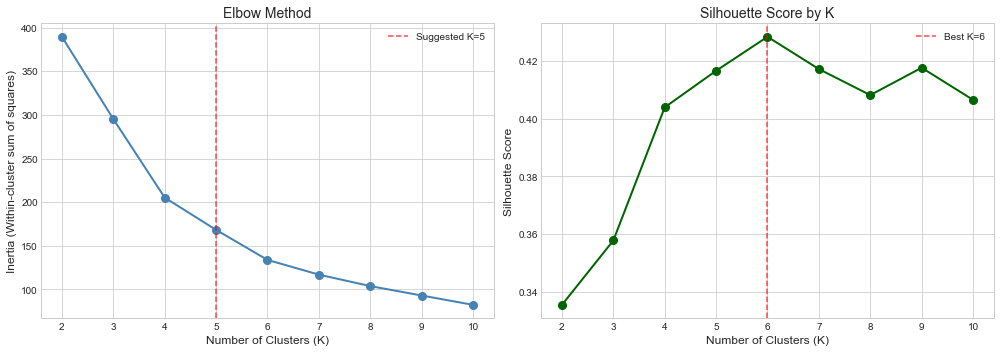


Best K based on Silhouette Score: 6


In [121]:
# Plot Elbow Method and Silhouette Score
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Elbow Method
ax1 = axes[0]
ax1.plot(K_range, inertias, 'o-', color='steelblue', linewidth=2, markersize=8)
ax1.set_xlabel('Number of Clusters (K)', fontsize=12)
ax1.set_ylabel('Inertia (Within-cluster sum of squares)', fontsize=12)
ax1.set_title('Elbow Method', fontsize=14)
ax1.axvline(x=5, color='red', linestyle='--', alpha=0.7, label='Suggested K=5')
ax1.legend()

# Silhouette Score
ax2 = axes[1]
ax2.plot(K_range, silhouette_scores, 'o-', color='darkgreen', linewidth=2, markersize=8)
ax2.set_xlabel('Number of Clusters (K)', fontsize=12)
ax2.set_ylabel('Silhouette Score', fontsize=12)
ax2.set_title('Silhouette Score by K', fontsize=14)
best_k = K_range[np.argmax(silhouette_scores)]
ax2.axvline(x=best_k, color='red', linestyle='--', alpha=0.7, label=f'Best K={best_k}')
ax2.legend()

plt.tight_layout()
plt.savefig('kmeans_elbow_silhouette.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nBest K based on Silhouette Score: {best_k}")

In [123]:
# Apply K-Means with chosen K
K = 6  # Based on elbow and silhouette analysis

kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Add cluster labels to original dataframe
df['Cluster'] = clusters

print(f"K-Means with K={K}")
print(f"Silhouette Score: {silhouette_score(X_scaled, clusters):.4f}")
print(f"\nCustomers per cluster:")
print(df['Cluster'].value_counts().sort_index())

K-Means with K=6
Silhouette Score: 0.4284

Customers per cluster:
0    45
1    39
2    33
3    39
4    23
5    21
Name: Cluster, dtype: int64


## 5. Visualization: 2D and 3D

Now we visualize the clusters using PCA-reduced data.

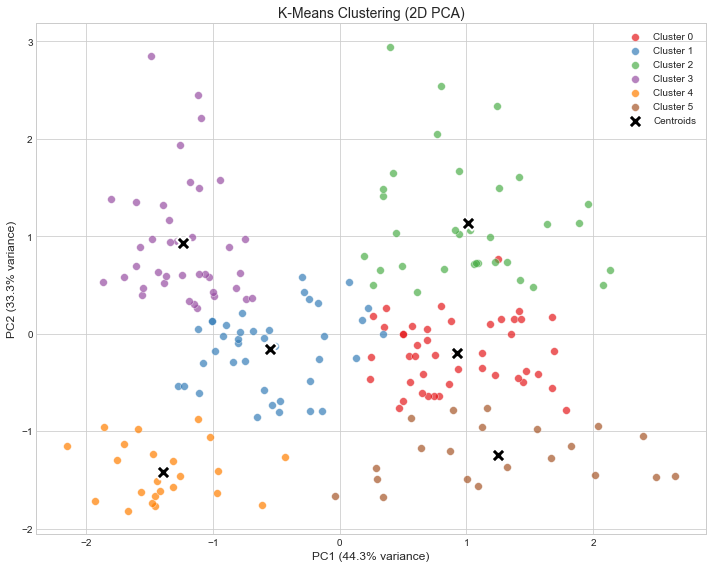

In [125]:
# 2D Visualization
fig, ax = plt.subplots(figsize=(10, 8))

# Define colors for each cluster (6 colors now)
colors = ['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00', '#a65628']
cluster_names = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Cluster 5']

for i in range(K):
    mask = clusters == i
    ax.scatter(X_pca_2d[mask, 0], X_pca_2d[mask, 1], 
               c=colors[i], label=cluster_names[i], 
               s=60, alpha=0.7, edgecolors='white', linewidth=0.5)

# Plot centroids
centroids_pca = pca_2d.transform(kmeans.cluster_centers_)
ax.scatter(centroids_pca[:, 0], centroids_pca[:, 1], 
           c='black', marker='X', s=200, edgecolors='white', linewidth=2,
           label='Centroids')

ax.set_xlabel(f'PC1 ({pca_2d.explained_variance_ratio_[0]*100:.1f}% variance)', fontsize=12)
ax.set_ylabel(f'PC2 ({pca_2d.explained_variance_ratio_[1]*100:.1f}% variance)', fontsize=12)
ax.set_title('K-Means Clustering (2D PCA)', fontsize=14)
ax.legend(loc='best')

plt.tight_layout()
plt.savefig('clusters_2d.png', dpi=150, bbox_inches='tight')
plt.show()

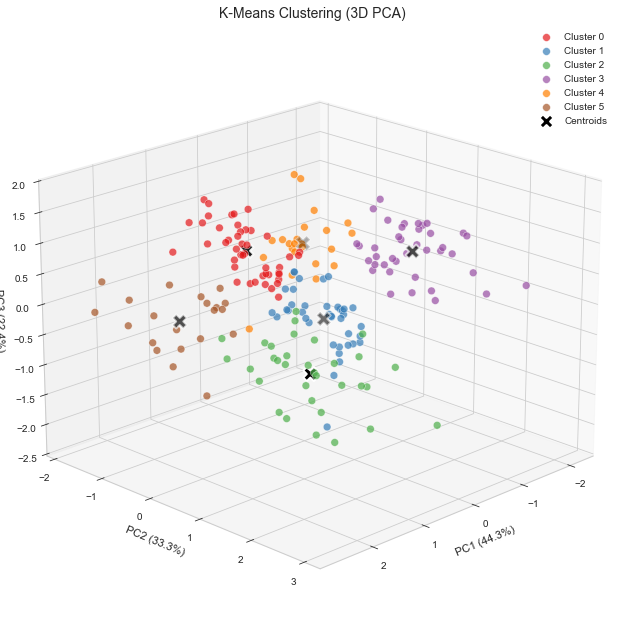

In [126]:
# 3D Visualization
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

for i in range(K):
    mask = clusters == i
    ax.scatter(X_pca_3d[mask, 0], X_pca_3d[mask, 1], X_pca_3d[mask, 2],
               c=colors[i], label=cluster_names[i], 
               s=60, alpha=0.7, edgecolors='white', linewidth=0.5)

# Plot centroids
centroids_pca_3d = pca_3d.transform(kmeans.cluster_centers_)
ax.scatter(centroids_pca_3d[:, 0], centroids_pca_3d[:, 1], centroids_pca_3d[:, 2],
           c='black', marker='X', s=200, edgecolors='white', linewidth=2,
           label='Centroids')

ax.set_xlabel(f'PC1 ({pca_3d.explained_variance_ratio_[0]*100:.1f}%)', fontsize=11)
ax.set_ylabel(f'PC2 ({pca_3d.explained_variance_ratio_[1]*100:.1f}%)', fontsize=11)
ax.set_zlabel(f'PC3 ({pca_3d.explained_variance_ratio_[2]*100:.1f}%)', fontsize=11)
ax.set_title('K-Means Clustering (3D PCA)', fontsize=14)
ax.legend(loc='best')

# Adjust viewing angle
ax.view_init(elev=20, azim=45)

plt.tight_layout()
plt.savefig('clusters_3d.png', dpi=150, bbox_inches='tight')
plt.show()

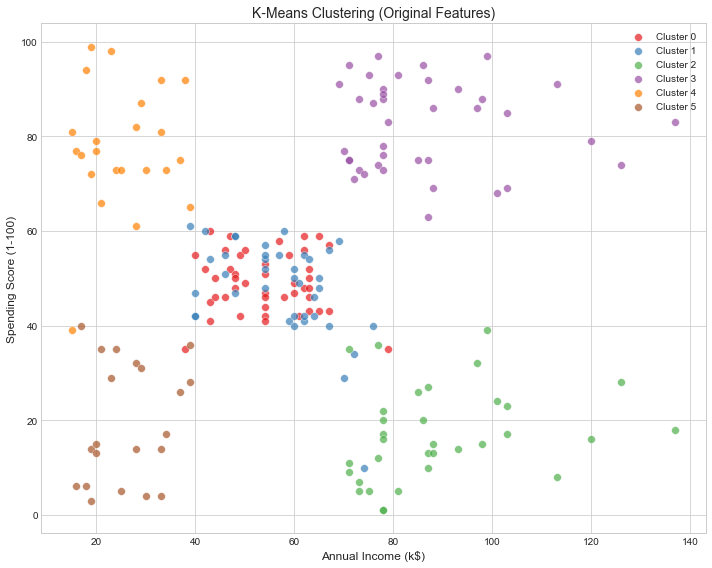

In [127]:
# Alternative: visualize using original features (2D: Income vs Spending)
fig, ax = plt.subplots(figsize=(10, 8))

for i in range(K):
    mask = df['Cluster'] == i
    ax.scatter(df.loc[mask, 'Annual Income (k$)'], 
               df.loc[mask, 'Spending Score (1-100)'],
               c=colors[i], label=cluster_names[i], 
               s=60, alpha=0.7, edgecolors='white', linewidth=0.5)

ax.set_xlabel('Annual Income (k$)', fontsize=12)
ax.set_ylabel('Spending Score (1-100)', fontsize=12)
ax.set_title('K-Means Clustering (Original Features)', fontsize=14)
ax.legend(loc='best')

plt.tight_layout()
plt.savefig('clusters_original_features.png', dpi=150, bbox_inches='tight')
plt.show()

## 6. Cluster Characteristics Analysis

Now we analyze what makes each cluster unique.

In [128]:
# Statistics for each cluster
cluster_stats = df.groupby('Cluster')[features].agg(['mean', 'std', 'min', 'max'])
print("Cluster Statistics:")
print(cluster_stats.round(2))

Cluster Statistics:
           Age                Annual Income (k$)                  \
          mean    std min max               mean    std min  max   
Cluster                                                            
0        56.33   8.45  43  70              54.27   8.98  38   79   
1        26.79   7.06  18  40              57.10  10.16  39   76   
2        41.94  10.18  19  59              88.94  16.59  71  137   
3        32.69   3.73  27  40              86.54  16.31  69  137   
4        25.00   5.30  18  35              25.26   7.72  15   39   
5        45.52  11.77  20  67              26.29   7.44  16   39   

        Spending Score (1-100)                 
                          mean    std min max  
Cluster                                        
0                        49.07   6.30  35  60  
1                        48.13   9.97  10  61  
2                        16.97   9.96   1  39  
3                        82.13   9.36  63  97  
4                        77.61 

In [129]:
# Mean values per cluster (easier to read)
cluster_means = df.groupby('Cluster')[features].mean().round(1)
cluster_means['Count'] = df.groupby('Cluster').size()

print("\nMean values per cluster:")
print(cluster_means)


Mean values per cluster:
          Age  Annual Income (k$)  Spending Score (1-100)  Count
Cluster                                                         
0        56.3                54.3                    49.1     45
1        26.8                57.1                    48.1     39
2        41.9                88.9                    17.0     33
3        32.7                86.5                    82.1     39
4        25.0                25.3                    77.6     23
5        45.5                26.3                    19.4     21


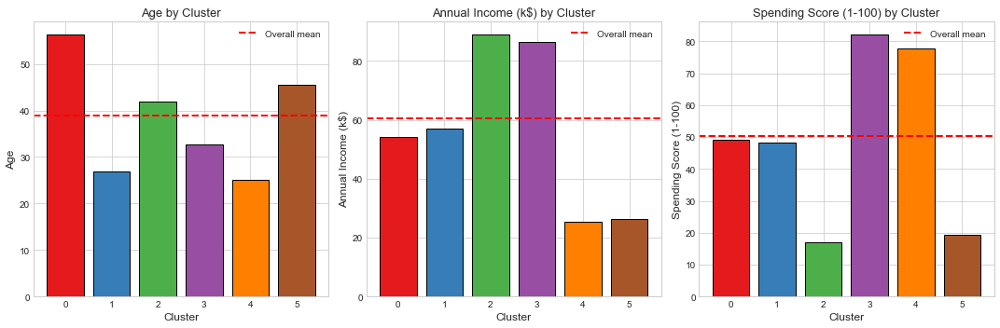

In [130]:
# Visualize cluster profiles with bar plot
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for idx, feature in enumerate(features):
    ax = axes[idx]
    means = df.groupby('Cluster')[feature].mean()
    bars = ax.bar(range(K), means, color=colors, edgecolor='black')
    ax.set_xlabel('Cluster', fontsize=12)
    ax.set_ylabel(feature, fontsize=12)
    ax.set_title(f'{feature} by Cluster', fontsize=13)
    ax.set_xticks(range(K))
    
    # Add overall mean line
    ax.axhline(y=df[feature].mean(), color='red', linestyle='--', 
               linewidth=2, label='Overall mean')
    ax.legend()

plt.tight_layout()
plt.savefig('cluster_profiles.png', dpi=150, bbox_inches='tight')
plt.show()

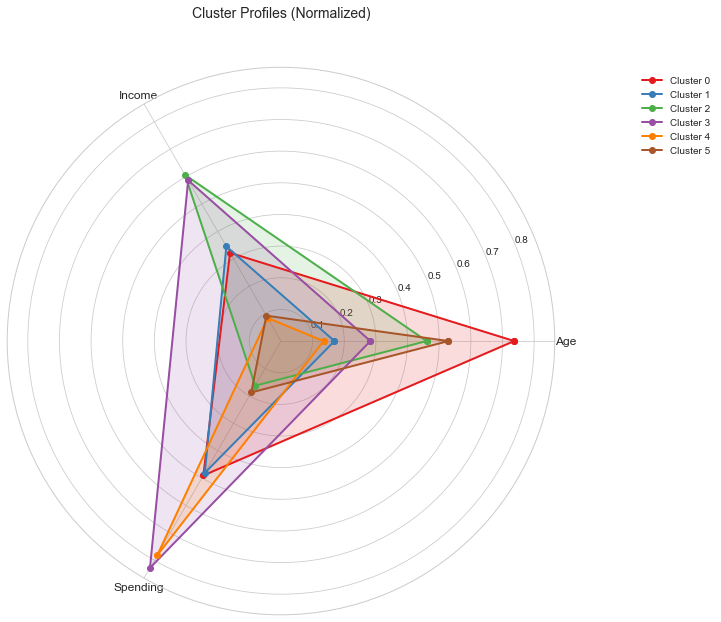

In [131]:
# Radar chart for cluster profiles
from math import pi

# Normalize means for radar chart (0-1 scale)
cluster_means_normalized = df.groupby('Cluster')[features].mean()
for col in features:
    cluster_means_normalized[col] = (cluster_means_normalized[col] - df[col].min()) / (df[col].max() - df[col].min())

# Create radar chart
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection='polar'))

# Number of variables
num_vars = len(features)
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Close the plot

for i in range(K):
    values = cluster_means_normalized.loc[i].values.tolist()
    values += values[:1]  # Close the plot
    ax.plot(angles, values, 'o-', linewidth=2, color=colors[i], label=f'Cluster {i}')
    ax.fill(angles, values, alpha=0.15, color=colors[i])

# Labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(['Age', 'Income', 'Spending'], fontsize=12)
ax.set_title('Cluster Profiles (Normalized)', fontsize=14, y=1.08)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.0))

plt.tight_layout()
plt.savefig('cluster_radar.png', dpi=150, bbox_inches='tight')
plt.show()

Based on the analysis above, we can give meaningful names to our clusters:

In [133]:
# Create interpretation based on cluster characteristics
cluster_interpretation = {
    0: 'Older moderates - Older customers, medium income, medium spending',
    1: 'Young moderates - Young customers, medium income, medium spending',
    2: 'Careful high-earners - Middle-aged, high income, LOW spending (saving-oriented)',
    3: 'Young big spenders - Young, high income, HIGH spending (target for premium products)',
    4: 'Young budget spenders - Young, low income, HIGH spending (impulsive buyers?)',
    5: 'Older budget savers - Middle-aged, low income, LOW spending (price-sensitive)'
}

print("=" * 70)
print("CLUSTER INTERPRETATION")
print("=" * 70)

for cluster_id in range(K):
    cluster_data = df[df['Cluster'] == cluster_id]
    print(f"\n🔹 CLUSTER {cluster_id}: {cluster_interpretation[cluster_id]}")
    print(f"   Size: {len(cluster_data)} customers ({len(cluster_data)/len(df)*100:.1f}%)")
    print(f"   Avg Age: {cluster_data['Age'].mean():.1f} years")
    print(f"   Avg Income: ${cluster_data['Annual Income (k$)'].mean():.1f}k")
    print(f"   Avg Spending Score: {cluster_data['Spending Score (1-100)'].mean():.1f}")

CLUSTER INTERPRETATION

🔹 CLUSTER 0: Older moderates - Older customers, medium income, medium spending
   Size: 45 customers (22.5%)
   Avg Age: 56.3 years
   Avg Income: $54.3k
   Avg Spending Score: 49.1

🔹 CLUSTER 1: Young moderates - Young customers, medium income, medium spending
   Size: 39 customers (19.5%)
   Avg Age: 26.8 years
   Avg Income: $57.1k
   Avg Spending Score: 48.1

🔹 CLUSTER 2: Careful high-earners - Middle-aged, high income, LOW spending (saving-oriented)
   Size: 33 customers (16.5%)
   Avg Age: 41.9 years
   Avg Income: $88.9k
   Avg Spending Score: 17.0

🔹 CLUSTER 3: Young big spenders - Young, high income, HIGH spending (target for premium products)
   Size: 39 customers (19.5%)
   Avg Age: 32.7 years
   Avg Income: $86.5k
   Avg Spending Score: 82.1

🔹 CLUSTER 4: Young budget spenders - Young, low income, HIGH spending (impulsive buyers?)
   Size: 23 customers (11.5%)
   Avg Age: 25.0 years
   Avg Income: $25.3k
   Avg Spending Score: 77.6

🔹 CLUSTER 5: Olde

---
**References:**
- Jolliffe (2002). Principal Component Analysis
- van der Maaten & Hinton (2008). Visualizing Data using t-SNE
- McInnes et al. (2018). UMAP
- Liu et al. (2008). Isolation Forest